In [2]:
cd("/home/ritaferi/Phd/SSDdev/")
using Pkg
Pkg.activate(".")
Pkg.instantiate()

using SolidStateDetectors
using Unitful
using Plots
using LegendHDF5IO
using HDF5



  Activating project at `~/Phd/SSDdev`


In [3]:
using Random
using SpecialFunctions
using Distributions

In [4]:
t_ann = 18 * 60 # 18 minutes in seconds
T_ann = 623 
Na = 3*10^9
R = 1.98

H = if 473 <= T_ann <= 873
    11800
else
    10700
end

D0 = if 473 <= T_ann <= 873
    2.5*10^(-3)
else
    1.3*10^(-3)
end

Ns = 10^(21.27 - 2610/T_ann)


1.2039096635950326e17

In [5]:
D_Li = D0 * exp(-H / (R * T_ann))

1.7518396803995296e-7

In [6]:
D_Li = D0 * exp(-H / (R * T_ann))

Nd(x) = Ns .* erfc.(x ./ (2 * sqrt(D_Li * t_ann)))
NI_net(x) = Nd(x) .- Na


NI_net (generic function with 1 method)

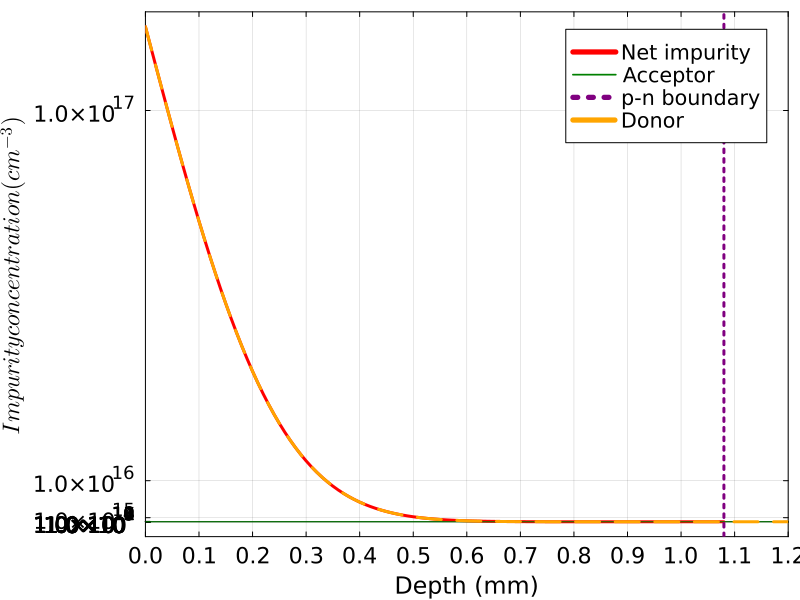

In [7]:

using LaTeXStrings

x = 0:0.001: 0.12

idx = findall(abs.(Nd.(x) .- Na) .< 1e9)  # tolerance for numerical comparison
x_intersect = x[idx][1]  # take the first intersection


mask = NI_net.(x) .> 0

plot(x[mask] .* 10,
     NI_net.(x[mask]),
     label="Net impurity",
     color = :red,
     #yscale=:log10,
     frame = :box, lw = 3)
hline!([Na], label="Acceptor", color=:green)

vline!([x_intersect*10], label="p-n boundary", color=:purple, lw=3, ls=:dot)

plot!(x .* 10, Nd.(x),
     label="Donor",
     color=:orange,
     ls=:dash, #yscale= :log10,
     lw = 3)
plot!(xticks = 0:0.1:1.2, 
     yticks = 10 .^ (0:1:17),
     xguidefontsize = 16,          # dimensione label asse x
    yguidefontsize = 16,          # dimensione label asse y
    tickfontsize = 15,             # dimensione numeri dei tick su entrambi gli assi
    legendfontsize = 14 ,  
     xlims=(0, 1.2), xlabel="Depth (mm)", ylabel=L"Impurity concentration (cm^{-3})",  legend=:topright, size=(800, 600))
#savefig("/home/ritaferi/Phd/ChargeTrappingModel_dev/plot/Impurity_profile.png")



# 2D distribution

In [35]:
using Plots, SpecialFunctions, Random, Distributions

L = 0.2
dx = 0.001
x = 0:dx:L
Ly = 0.2

mm_to_cm = 1.0  # se sei già in cm lascia 1.0

# Fattore di thinning (scegli tu)
α = 1e-10
   # più piccolo → meno punti

x_positions = Float64[]
y_positions = Float64[]

for xi in x

    Nd_val = Nd(xi)

    # volume slice 2D (area)
    dA =  dx * Ly * Ly

    # parametro Poisson ridotto
    λ = α * Nd_val  * dA

    N_i = rand(Poisson(λ))

    for _ in 1:N_i
        push!(x_positions, xi + rand()*dx)
        push!(y_positions, rand()*Ly)
    end
end

println("Generati $(length(x_positions)) punti (thinned Poisson)")

Generati 7659 punti (thinned Poisson)


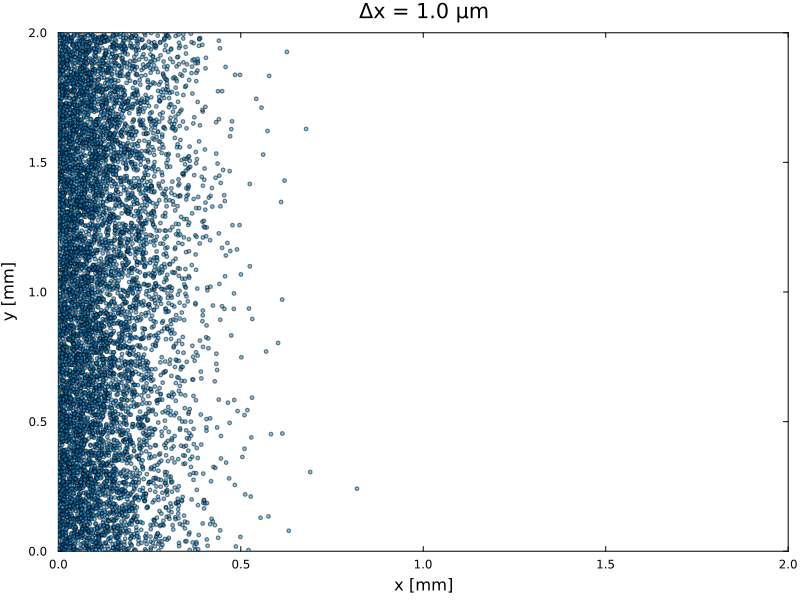

In [36]:
# ------------------------------
# Plot 2D con linee verticali
# ------------------------------

p = plot(x_positions .*10, y_positions .*10, markersize=2, alpha=0.5, seriestype=:scatter,
        xlabel="x [mm]", ylabel="y [mm]", title = "Δx = $(dx*1000) μm",  label="", xlims=(0, L*10), ylims=(0, Ly*10),
        size=(800, 600),grid=false, frame=:box)

# p-n boundary

# linee verticali dei bin dx in un’unica chiamata
#vline!(x .* 10, color=:gray, lw=0.5, alpha=0.3, label="")
savefig(p, "/home/ritaferi/Phd/ChargeTrappingModel_dev/plot/2D_sim_$(dx*1000).png")

display(p)

In [ ]:
using Plots, SpecialFunctions

# ------------------------------
# Parametri fisici realistici
# ------------------------------

# Dimensioni campione (mm)
Lx = 2.0
Ly = 2.0

# Risoluzione griglia
nx = 200
ny = 200

x = range(0, Lx, length=nx)
y = range(0, Ly, length=ny)

mm_to_cm = 0.1

# ------------------------------
# Calcolo Nd(x)
# ------------------------------
Nd_x = Nd.(x .* mm_to_cm)  # converti x in cm per Nd

# Creiamo matrice 2D replicando lungo Y
Nd_map = [Nd_x[i] for i in 1:nx, j in 1:ny]

# ------------------------------
# Plot heatmap
# ------------------------------
p = heatmap(x, y, Nd_map',
        xlabel="X (mm)",
        ylabel="Y (mm)",
        colorbar_title="cm⁻³")

vline!([x_intersect*10], label="p-n boundary", color=:white, lw=2, ls=:dot, size =(600, 500), legend= false)
#savefig("/home/ritaferi/Phd/ChargeTrappingModel_dev/plot/heatmap.png")
display(p)

# working on the PDF

In [ ]:
using QuadGK
L = 0.2 # 2mm in cm
int_N, err = quadgk(Nd, 0, L)
println("Integrale numerico: ", int_N, "errore: ", err)

In [ ]:
n_points = 1000
# Normalizzazione per PDF
dx = L/n_points
pdf_vals = Nd.(x) ./sum(Nd.(x) .* dx) ; # somma ≈ 1
plot(x .* 10, pdf_vals,
    xlabel="x [mm]",
    ylabel="PDF",  
    frame = :box,
    lw=2)
savefig("/home/ritaferi/Phd/ChargeTrappingModel_dev/plot/PDF.png")

In [ ]:
cdf_prova = cumsum(pdf_vals * dx);
plot(x .* 10, cdf_prova, label="CDF", xlabel="x [mm]", ylabel="CDF", frame = :box, lw=2)
savefig("/home/ritaferi/Phd/ChargeTrappingModel_dev/plot/CDF.png")

# 3D

In [37]:

# Parametri diffusione
# ------------------------------
t_ann = 18 * 60
T_ann = 623
Na = 3e9
R = 1.98
H = if 473 <= T_ann <= 873 11800 else 10700 end
D0 = if 473 <= T_ann <= 873 2.5e-3 else 1.3e-3 end
Ns = 10^(21.27 - 2610/T_ann)
D_Li = D0 * exp(-H / (R * T_ann))

# ------------------------------
# Parametri geometria
# ------------------------------
Lx = 0.2
Ly = 0.2
Lz = 0.2
dx = 0.001
x = 0:dx:Lx

# ------------------------------
# Profilo Nd(x)
# ------------------------------
Nd_vals = Ns .* erfc.(x ./ (2 * sqrt(D_Li * t_ann)))

# ------------------------------
# Fattore alpha per thinning Poissoniano
# ------------------------------
α = 1e-10  # più piccolo = meno punti

# ------------------------------
# Generazione posizioni 3D con Poisson thinning
# ------------------------------
x_positions = Float64[]
y_positions = Float64[]
z_positions = Float64[]

for i in 1:length(x)
    Nd_val = Nd_vals[i]
    
    # numero medio atteso in questa slice (dx * Ly * Lz)
    λ = α * Nd_val * dx * Ly * Lz
    
    # numero reale di punti Poisson
    N_i = rand(Poisson(λ))
    
    for _ in 1:N_i
        push!(x_positions, x[i] + rand()*dx)
        push!(y_positions, rand()*Ly)
        push!(z_positions, rand()*Lz)
    end
end

println("Generati $(length(x_positions)) punti (thinned Poisson)")

# ------------------------------
# Plot 3D


Generati 7770 punti (thinned Poisson)


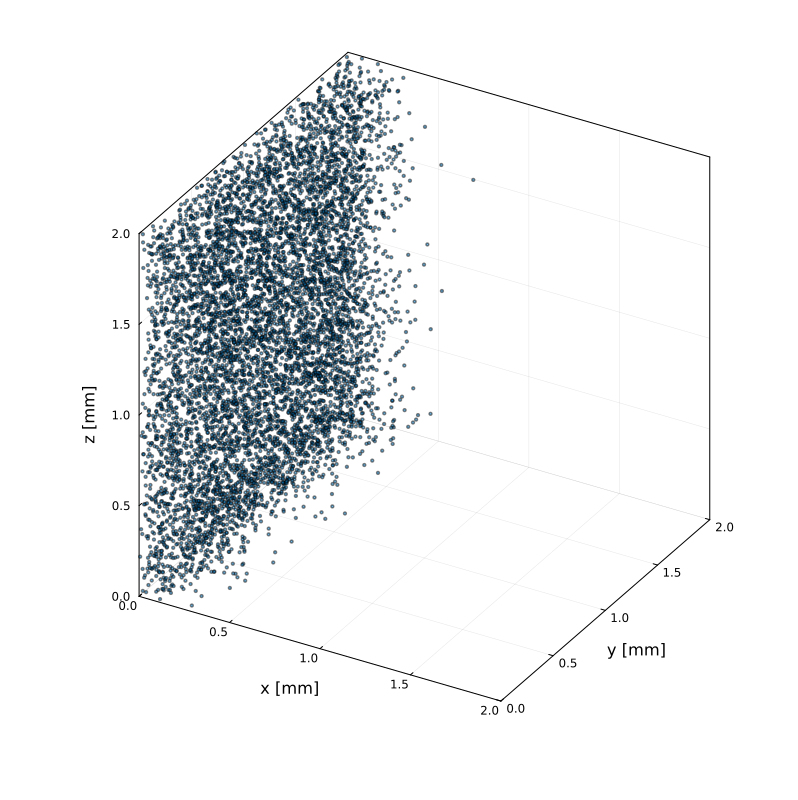

In [38]:
# ------------------------------
p = scatter3d(x_positions .*10, y_positions .*10, z_positions .*10,
          markersize=1.5, alpha=0.5,
          xlabel="x [mm]", ylabel="y [mm]", zlabel="z [mm]",
          xlims=(0,Lx*10), ylims=(0,Ly*10), zlims=(0,Lz*10),
          legend=false,  camera=(30, 30), size=(800,800), frame=:box)

savefig(p, "/home/ritaferi/Phd/ChargeTrappingModel_dev/plot/3D_sim.png")
display(p)

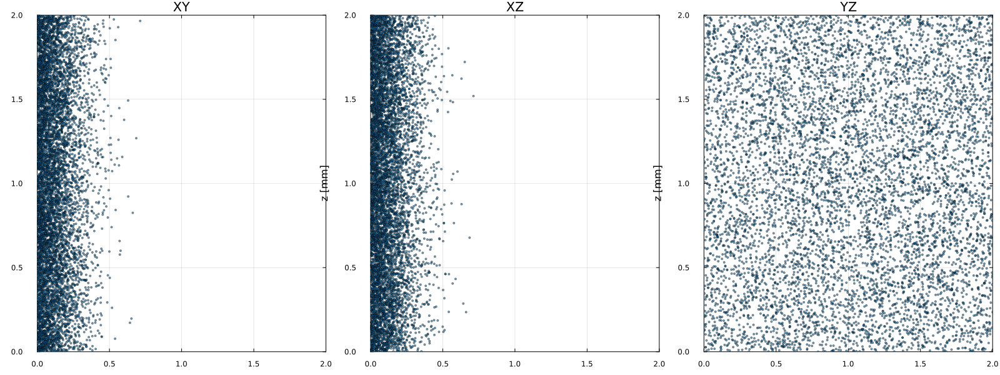

In [39]:

# ------------------------------
# Plot 3 subplots: XY, XZ, YZ
# ------------------------------
p1 = scatter(x_positions.*10, y_positions.*10, markersize=1.5, alpha=0.5,
             xlabel="x [mm]", ylabel="y [mm]", title="XY", legend=false,
             xlims=(0,Lx*10), ylims=(0,Ly*10), vline=[x_intersect*10], linecolor=:grey, linestyle=:dot, linewidth=3)

p2 = scatter(x_positions.*10, z_positions.*10, markersize=1.5, alpha=0.5,
             xlabel="x [mm]", ylabel="z [mm]", title="XZ", legend=false,
             xlims=(0,Lx*10), ylims=(0,Lz*10), vline=[x_intersect*10], linecolor=:grey, linestyle=:dot, linewidth=3)

p3 = scatter(y_positions.*10, z_positions.*10, markersize=1.5, alpha=0.5,
             xlabel="y [mm]", ylabel="z [mm]", title="YZ", legend=false,
             xlims=(0,Ly*10), ylims=(0,Lz*10))

p = plot(p1, p2, p3, layout=(1,3), size=(1600,600), frame=:box)

savefig(p, "/home/ritaferi/Phd/ChargeTrappingModel_dev/plot/angolazioni_sim.png")
display(p)

## Litio lineare (thesis)

In [ ]:
using Plots, Random

# ----------------------------
# Parametri geometrici
# ----------------------------
L = 0.2        # profondità in cm (1 mm)
Ly = 0.2        # larghezza in cm
dx = 0.0001     # passo in cm (1 μm)

# Conversione mm → cm per plot
mm_to_cm = 0.1

# ----------------------------
# Funzione densità Nd(x)
# Litio decresce linearmente da 0.5% a 0%
# ----------------------------
function Nd(x)
    c0 = 0.005       # 0.5 % come frazione
    L_max = 0.1      # profondità massima in cm
    return c0 * max(0, 1 - x / L_max)
end

# ----------------------------
# Generazione punti 2D deterministici
# ----------------------------
x = 0:dx:L
x_positions = Float64[]
y_positions = Float64[]

scale_factor = 1e4  # controlla quanti punti per frazione di litio

for xi in x
    Nd_val = Nd(xi)
    N_points = Int(round(Nd_val * scale_factor))  # punti proporzionali a Nd

    for _ in 1:N_points
        push!(x_positions, xi + rand()*dx)
        push!(y_positions, rand()*Ly)
    end
end

println("Generati $(length(x_positions)) punti proporzionali alla concentrazione di litio")

# ----------------------------
# Plot 2D
# ----------------------------
scatter(x_positions .*10, y_positions .*10, markersize=2, alpha=0.5,
        xlabel="x [mm]", ylabel="y [mm]", label="", xlims=(0, L*10), ylims=(0, Ly*10),
        size=(800, 600), frame=:box)
vline!([x_intersect], color=:purple, lw=2, ls=:dot)

savefig("/home/ritaferi/Phd/ChargeTrappingModel_dev/plot/2D_sim_thesis.png")

In [ ]:
using Plots

# ------------------------------
# Parametri fisici
# ------------------------------
Lx = 2.0   # mm
Ly = 2.0   # mm
nx = 200
ny = 200

x = range(0, Lx, length=nx)
y = range(0, Ly, length=ny)

mm_to_cm = 0.1

# ------------------------------
# Funzione Nd(x) lineare decrescente
# ------------------------------
function Nd(x)
    c0 = 0.005       # 0.5 % come frazione
    L_max = 0.1      # profondità massima in cm (1 mm)
    return c0 * max(0, 1 - x / L_max)
end

# ------------------------------
# Calcolo mappa 2D
# ------------------------------
Nd_x = Nd.(x .* mm_to_cm)        # converti x in cm per Nd
Nd_map = [Nd_x[i] for i in 1:nx, j in 1:ny]  # replica lungo y

# ------------------------------
# Plot heatmap con nuovo colore
# ------------------------------
heatmap(x, y, Nd_map',
        xlabel="X (mm)",
        ylabel="Y (mm)",
        colorbar_title="Concentrazione di Li (frazione)",
                 # scala colori modificata
        size=(600, 500),
        legend=false)

# linea verticale per p-n boundary (opzionale)
x_intersect = 1.0   # esempio: profondità 1 mm
vline!([x_intersect], color=:white, lw=2, ls=:dot)
#savefig("/home/ritaferi/Phd/ChargeTrappingModel_dev/plot/heatmap_thesis.png")

## Diffusion

In [ ]:
det_rin = 1u"mm"
det_z = det_r = 10u"mm"
z_draw = det_z/2
pn_r = 8.957282u"mm" # this one was calculated by searching the zero impurity point (displayed in the following section)

T = Float64;
sim = Simulation{T}(SSD_examples[:TrueCoaxial])
cfn = SSD_examples[:TrueCoaxial]
print(open(f -> read(f, String), cfn))
plot(sim.detector, xunit = u"mm", yunit = u"mm", zunit = u"mm")

In [ ]:
using SolidStateDetectors: Electron, Hole
cdm = sim.detector.semiconductor.charge_drift_model
depth_list = 0u"mm":0.01u"mm":(det_r-pn_r)
mobility_list = map(depth -> let pt::CartesianPoint{T} = CartesianPoint(det_r - depth, 0, z_draw)
    (µe = SolidStateDetectors.calculate_mobility(cdm, pt, Hole) * 10000u"cm^2/(V*s)",
     µh = SolidStateDetectors.calculate_mobility(cdm, pt, Electron) * 10000u"cm^2/(V*s)")
end, depth_list)
plot(depth_list,  getfield.(mobility_list, :µh), label = "Hole", lw = 4)
plot!(depth_list, getfield.(mobility_list, :µe), label = "Electron", lw = 4)
plot!(xlabel = "Depth to surface / mm", ylabel = "Mobility / cm\$^2\$/Vs", unitformat = :nounit, legend = :topleft, xlims = (0u"mm", det_r-pn_r))

In [ ]:
cdm.temperature 

In [ ]:
kB = 1.380649e-23

In [ ]:
T =  80 
µ = 4.2e4

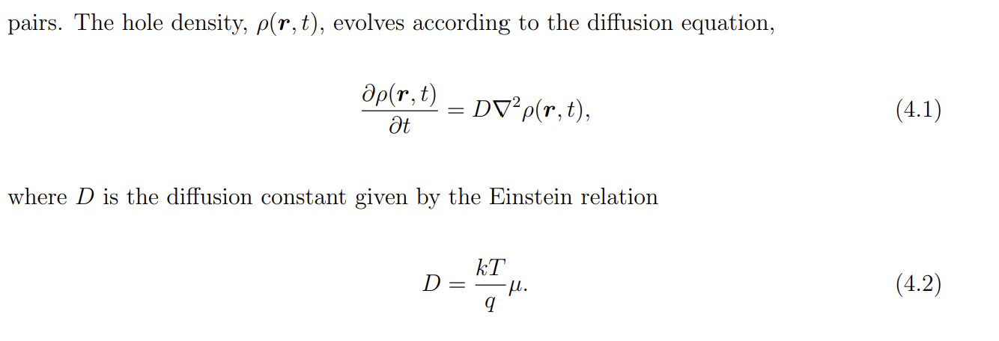